# Import Libs

In [1]:
import torch
import torch.nn as nn
import torch.utils.data as data
import torch.nn.functional as F
print('torch version:', torch.__version__)

import os
import numpy as np
from glob import glob
import glob
import random
import imageio
from torchvision import transforms
from collections import defaultdict

from skimage import measure, io, draw
from PIL import Image
from tqdm.notebook import tqdm

from sklearn.metrics import jaccard_score
import matplotlib.pyplot as plt

from shapely.geometry import Polygon

import segmentation_models_pytorch as smp

torch version: 1.6.0


# Import Dataset
- Import folder with images
- Import folder with masks (containing the buffers)
- Create list with training, validation and testing data

In [2]:
# 1 PIXEL BUFFER
train_imgs = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/image_train/*tiff")
val_imgs = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/image_val/*tiff")
test_imgs = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/image_test/*tiff")

train_masks = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/class_train/*png")
val_masks = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/class_val/*png")
test_masks = glob.glob("F:/0_BOX_FREE_PANOPTIC/borders/24/class_test/*png")

# Define Weights

A simple method to obtain the weights of each class, in which the less recurring labels receive a higher weight.

First, we count the number of pixels of each class. Second, we identify the number of pixels from the most representative class (in our case, the permeable areas). Finally, the weight of each class is given by dividing the most representative class by the class being analyzed. 

In [ ]:
c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,c15,c16,c17,c18,c19,c20,c21 =[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]

for msk_img in train_masks:
    actual_image = imageio.imread(msk_img)
    
    c0.append(np.where(actual_image==0,1,0).sum())
    c1.append(np.where(actual_image==1,1,0).sum())
    c2.append(np.where(actual_image==2,1,0).sum())
    c3.append(np.where(actual_image==3,1,0).sum())
    c4.append(np.where(actual_image==4,1,0).sum())
    c5.append(np.where(actual_image==5,1,0).sum())
    c6.append(np.where(actual_image==6,1,0).sum())
    c7.append(np.where(actual_image==7,1,0).sum())
    c8.append(np.where(actual_image==8,1,0).sum())
    c9.append(np.where(actual_image==9,1,0).sum())
    c10.append(np.where(actual_image==10,1,0).sum())
    c11.append(np.where(actual_image==11,1,0).sum())
    c12.append(np.where(actual_image==12,1,0).sum())
    c13.append(np.where(actual_image==13,1,0).sum())
    c14.append(np.where(actual_image==14,1,0).sum())
    c15.append(np.where(actual_image==15,1,0).sum())
    c16.append(np.where(actual_image==16,1,0).sum())
    c17.append(np.where(actual_image==17,1,0).sum())
    c18.append(np.where(actual_image==18,1,0).sum())
    c19.append(np.where(actual_image==19,1,0).sum())
    c20.append(np.where(actual_image==20,1,0).sum())
    c21.append(np.where(actual_image==21,1,0).sum())
    
    del actual_image

max_val = max(sum(c0), sum(c1), sum(c2), sum(c3), sum(c4), sum(c5), sum(c6), sum(c7), sum(c8), sum(c9), sum(c10), sum(c11), sum(c12), sum(c13), sum(c14), sum(c15), sum(c16), sum(c17), sum(c18), sum(c19), sum(c20), sum(c21))
print(max_val)

weights = [round(max_val/sum(c0),1).astype(float),
           round(max_val/sum(c1),1).astype(float),
           round(max_val/sum(c2),1).astype(float),
           round(max_val/sum(c3),1).astype(float),
           round(max_val/sum(c4),1).astype(float),
           round(max_val/sum(c5),1).astype(float),
           round(max_val/sum(c6),1).astype(float),
           round(max_val/sum(c7),1).astype(float),
           round(max_val/sum(c8),1).astype(float),
           round(max_val/sum(c9),1).astype(float),
           round(max_val/sum(c10),1).astype(float),
           round(max_val/sum(c11),1).astype(float),
           round(max_val/sum(c12),1).astype(float),
           round(max_val/sum(c13),1).astype(float),
           round(max_val/sum(c14),1).astype(float),
           round(max_val/sum(c15),1).astype(float),
           round(max_val/sum(c16),1).astype(float),
           round(max_val/sum(c17),1).astype(float),
           round(max_val/sum(c18),1).astype(float),
           round(max_val/sum(c19),1).astype(float),
           round(max_val/sum(c20),1).astype(float),
           round(max_val/sum(c21),1).astype(float)]

print(weights)

In [3]:
# WEIGHT 1 PIXEL BUFFER
weights = torch.tensor([5.6,4.1,1.0,10.5,85.0,
                        1008.4,63.3,2824.5,91.1,78.7,
                        14.0,46.5,17.1,7.6,186.9,
                        138.4,10427.4,1752.6,405.7,
                        1762.1,128.4,969.0])

# Create Dataloader

In Pytorch we must create a Dataloader, as expressed below. The augmentation strategies are also set here. In our case, we applied the random horizontal and vertical flips.

In [4]:
class CustomDataset(data.Dataset):
    def __init__(self, image_paths, target_paths, transform=None, transform_label=None):

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transform = transform
        self.transform_label = transform_label
        
    def __getitem__(self, index):

        image = imageio.imread(self.image_paths[index])
        image = np.asarray(image, dtype='float32')
        
        m = imageio.imread(self.target_paths[index])
        mask = np.asarray(m, dtype='int64')
        
        seed = np.random.randint(2147483647)
        random.seed(seed)
        torch.manual_seed(seed)
        
        if self.transform is not None:
            image = self.transform(image)
            
        random.seed(seed)
        torch.manual_seed(seed)
        if self.transform_label is not None:
            mask = self.transform(mask)
            mask = mask.squeeze(0)

        return image, mask

    def __len__(self):

        return len(self.image_paths)
    
# augmentations used in the process
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.RandomHorizontalFlip(),
                                transforms.RandomVerticalFlip()])


train_dataset = CustomDataset(train_imgs, train_masks, transform=transform, transform_label=transform)
val_dataset = CustomDataset(val_imgs, val_masks, transform=transforms.ToTensor(), transform_label=None)
test_dataset = CustomDataset(test_imgs, test_masks, transform=transforms.ToTensor(), transform_label=None)

# Import Model

There are many possible models to use. We chose the Efficient-net-b5 with the Unet architecture.

In [5]:
ENCODER = 'efficientnet-b5' # choose encoder. See Segmentation Models Pytorch for choosing.
ENCODER_WEIGHTS = 'imagenet' # Choose pre-trained weights

CLASSES = ['background',                         # label 0
           'road',                               # label 1
           'permeable area',                     # label 2
           'lake',                               # label 3
           'swimming pool',                      # label 4
           'harbor',                             # label 5
           'vehicle',                            # label 6
           'boat',                               # label 7
           'sports court',                       # label 8
           'soccer field',                       # label 9
           'commercial building',                # label 10
           'commercial building block',          # label 11
           'residential building',               # label 12
           'house',                              # label 13
           'small construction',                 # label 14
           'buffer vehicle',                     # label 15
           'buffer boat',                        # label 16 
           'buffer sports',                      # label 17
           'buffer commercial building',         # label 18
           'buffer commercial building block',   # label 19
           'buffer house',                       # label 20
           'buffer small construction']          # label 21

ACTIVATION = 'softmax' # Softmax for multi-class
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.Unet(
    in_channels = 3,
    encoder_name=ENCODER, 
    encoder_weights= ENCODER_WEIGHTS, 
    classes= len(CLASSES),
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

# Define Loss and Optimizer

In [6]:
loss = smp.utils.losses.CrossEntropyLoss(weight=weights)
metrics = [
    smp.utils.metrics.mIoU()
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [7]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

# Load all dataloaders

In [8]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=20, shuffle=False, num_workers=0)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=20, shuffle=False, num_workers=0)

# Train Model

We are saving the models with lowest cross entropy loss.

In [ ]:
max_score = 10
for i in range(0, 50):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)

    if max_score > valid_logs['cross_entropy_loss']:
        max_score = valid_logs['cross_entropy_loss']
        torch.save(model, '24_unet_effb5_3.pth')
        print('Model saved!')

# Load models

In [9]:
model = torch.load('24_unet_effb5_3.pth')

# Visualize results

This code show the original image, the label and the prediction

In [ ]:
import matplotlib.pyplot as plt

actual_img_count = 0
with torch.no_grad():
    
    for data in valid_loader:

        inp, lab = data

        inp = inp.to(DEVICE)
        lab = lab.to(DEVICE)
        pred = model(inp)

        for i in range(0, 5): # number of items per batch
            iou_score=0
            
            lab_unit = lab[i,:,:].cpu().numpy()
            
            inp_unit = inp[i,:,:,:].cpu().numpy()
            inp_unit = np.transpose(inp_unit, (1, 2, 0))
                        
            pred_img = pred[i,:,:,:].data.cpu().numpy()
            pred_img = np.argmax(pred_img, axis=0).reshape(512,512)

            NUM_ROWS = 1
            IMGs_IN_ROW = 3
            f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(15,15))

            ax[0].imshow(inp_unit/300)
            ax[1].imshow(pred_img)
            ax[2].imshow(lab_unit)

            ax[0].set_title('original image | '+str(actual_img_count+1))
            ax[1].set_title('prediction | '+str(actual_img_count+1))
            ax[2].set_title('ground truth | '+str(actual_img_count+1))

            ax[0].set_yticklabels([])
            ax[0].set_xticklabels([])

            ax[1].set_yticklabels([])
            ax[1].set_xticklabels([])

            ax[2].set_yticklabels([])
            ax[2].set_xticklabels([])

            print('ID:'+str(actual_img_count+1)+' | IoU: ' + str(round(iou_score, 3)))
            plt.tight_layout()
            
            plt.show()
            
            
            actual_img_count+=1

# Semantic to Panoptic

In [10]:
def increase_border(class_img, buffer_size=1):
    
    #create a 1 pixel padding
    padded_class = np.pad(class_img,buffer_size)

    # make a 1 pixel dislocation in all directions (up, down, left, right, down left, down right, up right, up left)
    left = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[:-(2*buffer_size), buffer_size:-(buffer_size)]
    right = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[2*buffer_size:, buffer_size:-(buffer_size)]
    up = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[buffer_size:-(buffer_size), :-(2*buffer_size)]
    down = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[buffer_size:-(buffer_size), 2*buffer_size:]

    left_down = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[:-(2*buffer_size), :-(2*buffer_size)]
    left_up = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[:-(2*buffer_size), 2*buffer_size:]
    right_down = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[2*buffer_size:, :-(2*buffer_size)]
    right_up = np.pad(padded_class, buffer_size, mode='constant', constant_values=0)[2*buffer_size:, 2*buffer_size:]

    class_list = [left, right, up, down, left_down, left_up, right_down, right_up]
    stack_class = np.stack(class_list, axis=2)
    max_arr = stack_class.max(axis=2,keepdims=False)
    max_arr = max_arr[buffer_size:-(buffer_size), buffer_size:-(buffer_size)]
    
    del left, right, up, down, left_down, left_up, right_down, right_up, class_list, stack_class
    
    return max_arr

In [11]:
def arrange_contours(contours):
    #sort by area
    poly_areas = []
    
    for contour in contours:
        p_area = Polygon(contour).area
        poly_areas.append(p_area)

    indexes = np.argsort(poly_areas)
    
    poly_areas_correct = []

    for index in sorted(indexes):
        poly_areas_correct.append(contours[index])
        
    return poly_areas_correct

# Semantic to Panoptic

Inputs: semantic segmentation prediction, lista com as classes stuff, lista com as classes things, lista com classes que tem borda
Output: Panoptic Segmentation prediction

- step 1: Create array with dimensions (H, W, Number of classes). This array will stack the final predictions.
- step 2: Since stuff classes do not require any processing, we append them in the array on channels 0, 1, 2, and three.

- step 3: Then we start a loop on the thing classes
- step 3.1: identify all contours. 
- step 3.2: arrange contours in ascending order. this is done in case polygons from the same object are on top of each other.
- step 3.3: eliminate small polygons using an area threshold.
- step 3.4: If the class present borders, we apply the growing border algorithm.
- step 3.5: Add prediction in this respective channel.

In [12]:
def semantic2panoptic(semantic_pred,
                      agnostic,
                      stuff_classes=[0,1,2,3], 
                      thing_classes=[4,5,6,7,8,9,10,11,12,13,14], 
                      border_true=[6,7,8,10,11,13,14], 
                      area_thresh=10, 
                      show_classes=False):
    
    semantic_pred = np.pad(semantic_pred, 1)
    panoptic_pred = np.zeros((semantic_pred.shape[0], semantic_pred.shape[1], len(stuff_classes)+len(thing_classes)), dtype='int32')
    
    for stuff_class in stuff_classes:
        panoptic_pred[:,:,stuff_class] = np.where(semantic_pred==stuff_class, stuff_class, 0)
    
    object_id = len(stuff_classes) #min number of thing class
    
    #actual_channel = len(stuff_classes)
    for thing_class in thing_classes: 
    
        # find contours
        contours = measure.find_contours(np.where(semantic_pred==thing_class, 1, 0), positive_orientation='low')
        contours = arrange_contours(contours)

        #print(thing_class, len(contours))

        # create array with zeros with the shape of the output image + 1 pixel padding in all sides
        class_img = np.zeros((semantic_pred.shape[0],semantic_pred.shape[1])).astype('int16')

        # iterate over contours
        for contour in contours:
            if Polygon(contour).area > area_thresh:
                polygon = np.asarray(contour)
                vertex_row_coords, vertex_col_coords = polygon.T
                fill_row_coords, fill_col_coords = draw.polygon(vertex_row_coords, 
                                                                vertex_col_coords, 
                                                                (semantic_pred.shape[0],semantic_pred.shape[1]))
                if agnostic == False:
                    class_img[fill_row_coords, fill_col_coords] = object_id
                    object_id += 1
                else:
                    class_img[fill_row_coords, fill_col_coords] = thing_class
                
        # Show predictions per class
        if show_classes == True:
            plt.figure(figsize=(8,8))
            plt.imshow(class_img)
            plt.show()
 
        if thing_class in border_true:
            panoptic_pred[:,:,thing_class] += increase_border(class_img)
            img_s = Image.fromarray(panoptic_pred[1:-1,1:-1,thing_class])
            img_s.save(str(thing_class) + '.tif')
        else:
            panoptic_pred[:,:,thing_class] += class_img
            img_s = Image.fromarray(panoptic_pred[1:-1,1:-1,thing_class])
            img_s.save(str(thing_class) + '.tif')
        
    return panoptic_pred[1:-1,1:-1,:]

ID:1 | IoU: 0


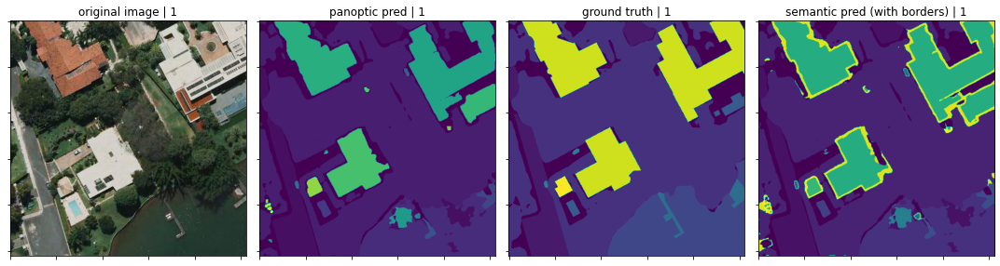

ID:2 | IoU: 0


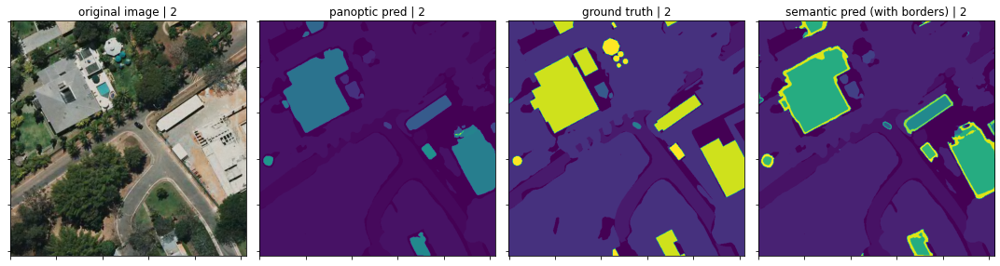

ID:3 | IoU: 0


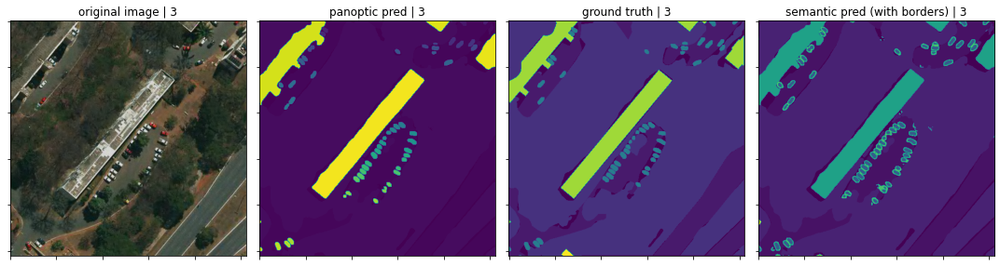

ID:4 | IoU: 0


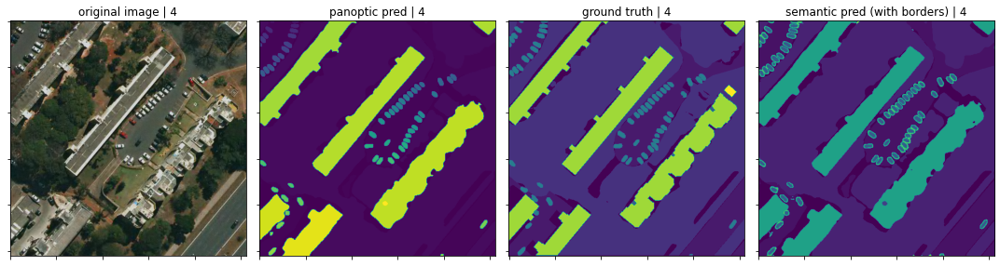

ID:5 | IoU: 0


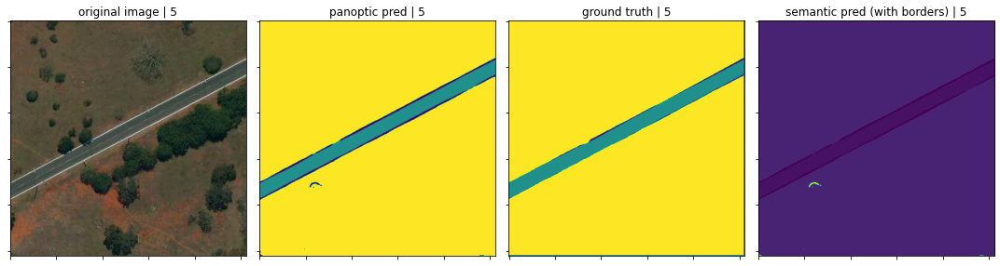

ID:6 | IoU: 0


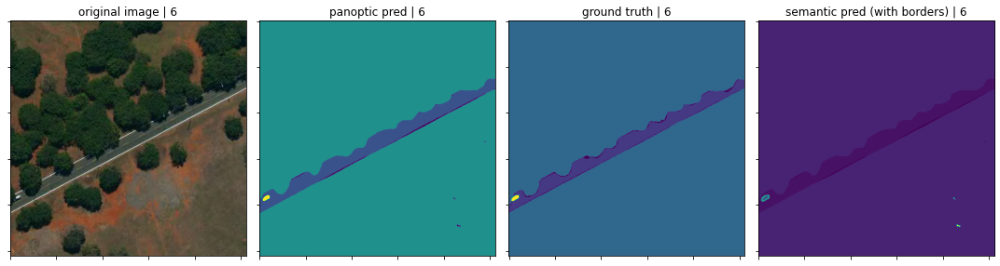

ID:7 | IoU: 0


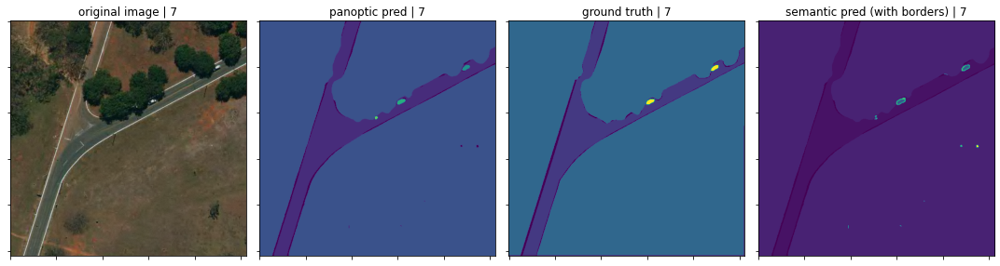

ID:8 | IoU: 0


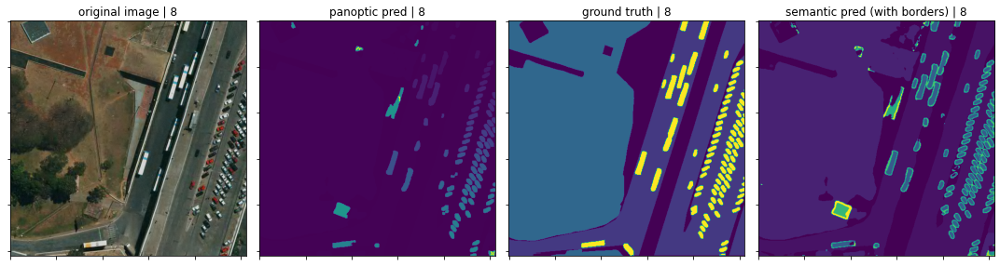

ID:9 | IoU: 0


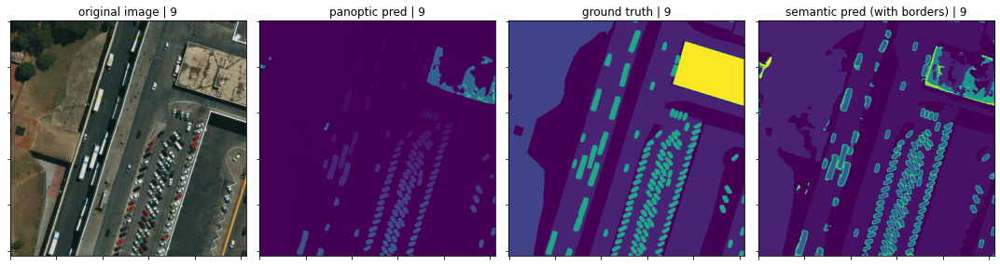

ID:10 | IoU: 0


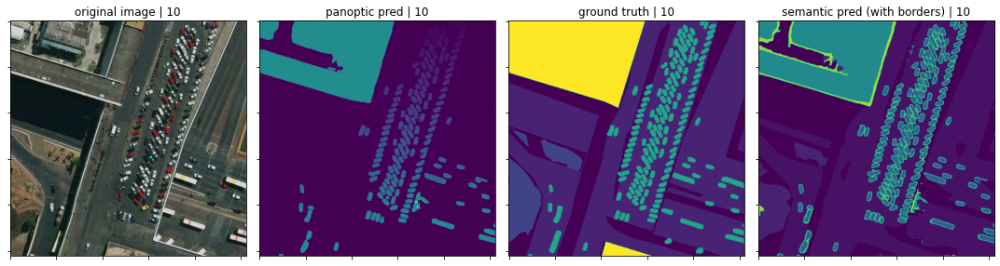

ID:11 | IoU: 0


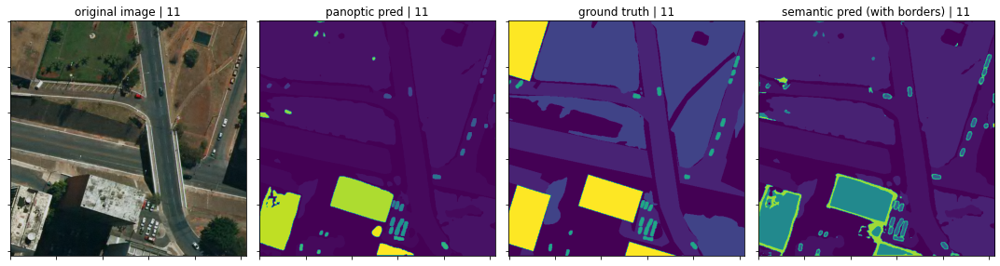

ID:12 | IoU: 0


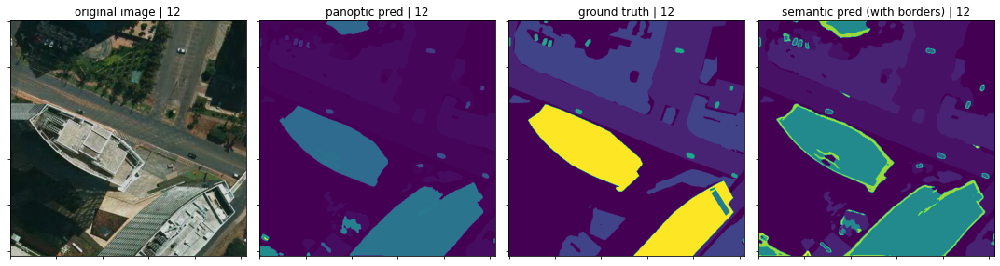

ID:13 | IoU: 0


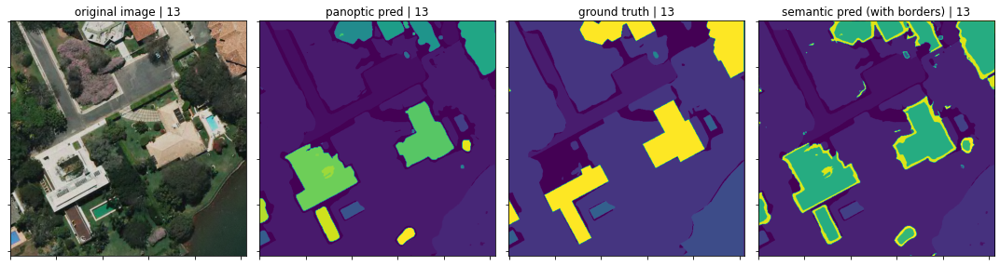

ID:14 | IoU: 0


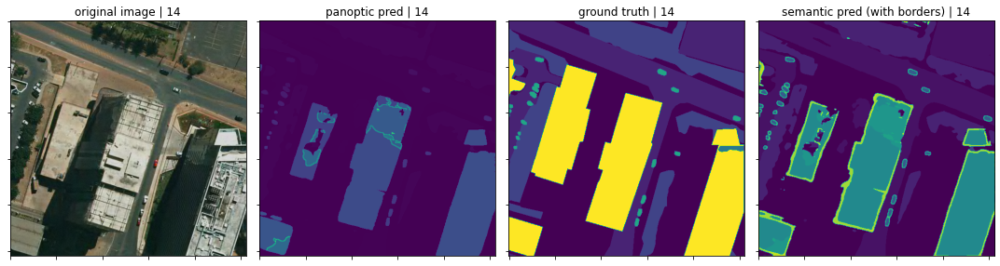

ID:15 | IoU: 0


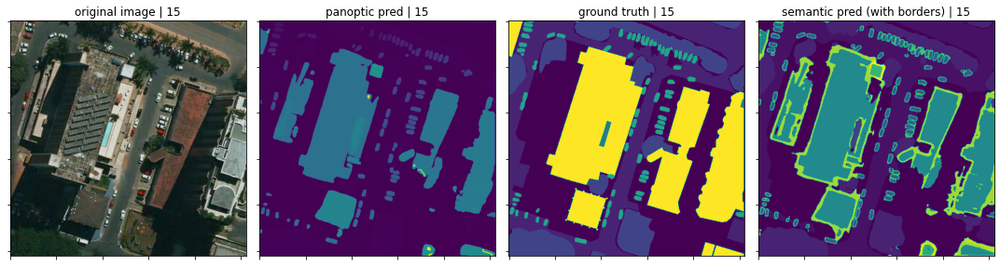

ID:16 | IoU: 0


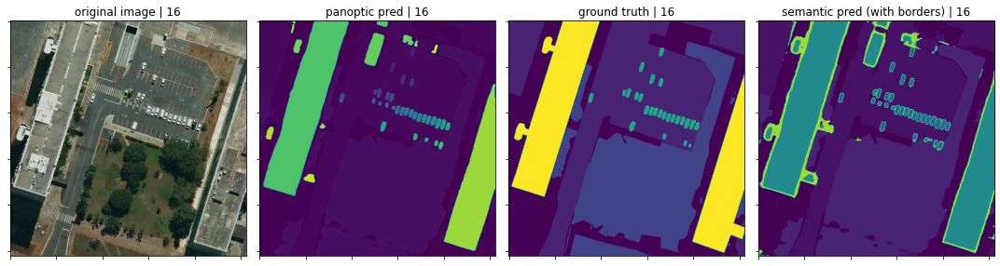

ID:17 | IoU: 0


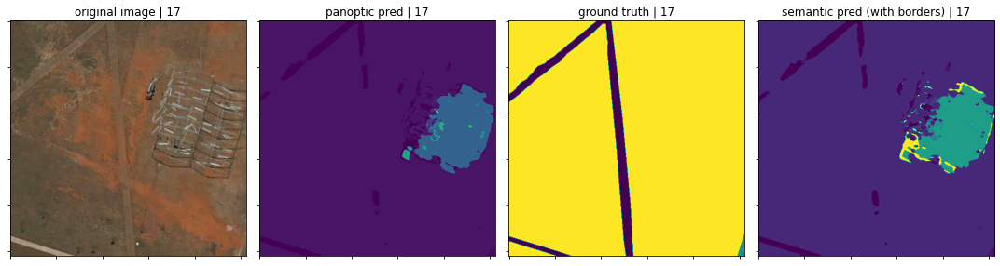

ID:18 | IoU: 0


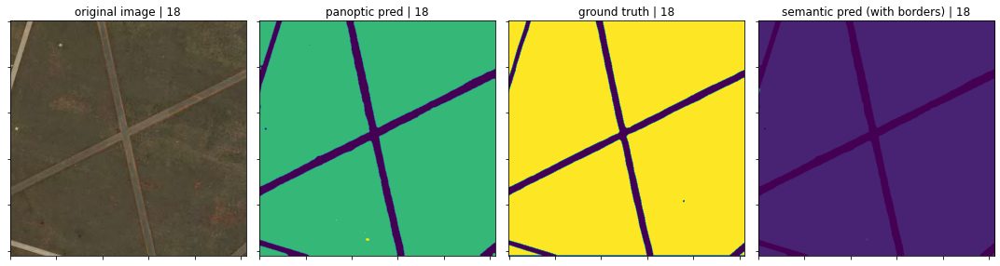

ID:19 | IoU: 0


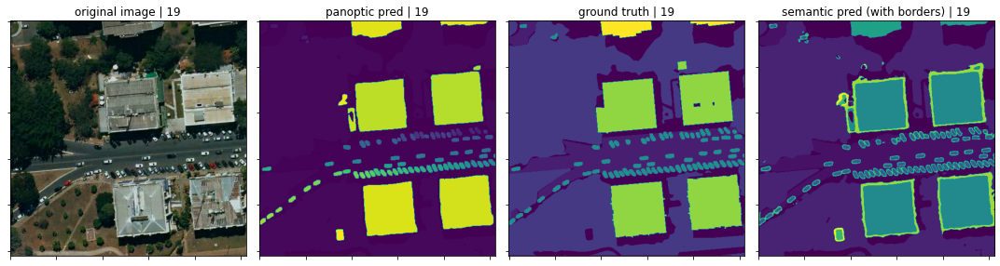

ID:20 | IoU: 0


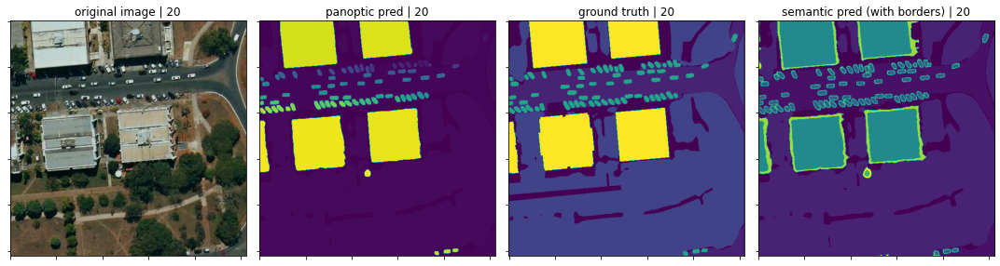

ID:21 | IoU: 0


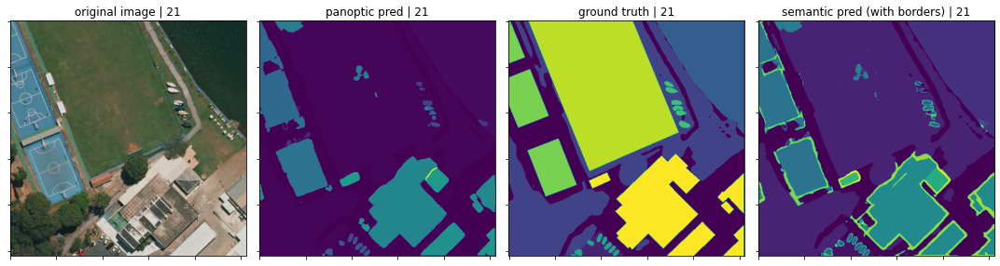

ID:22 | IoU: 0


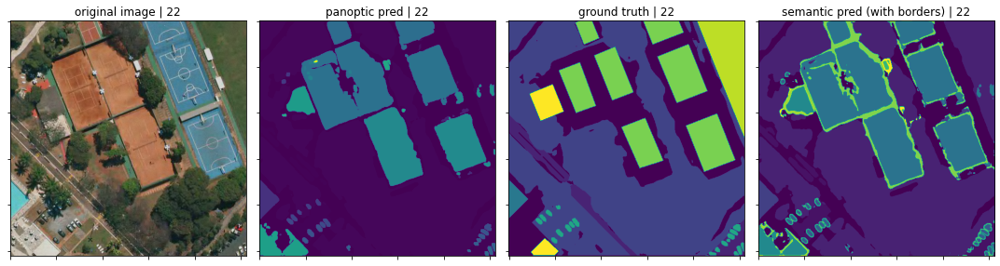

ID:23 | IoU: 0


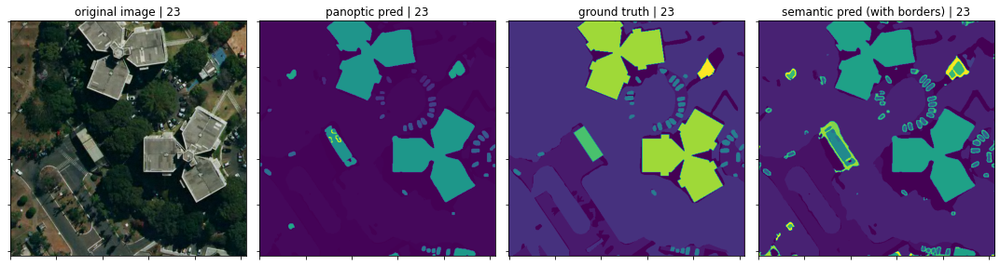

ID:24 | IoU: 0


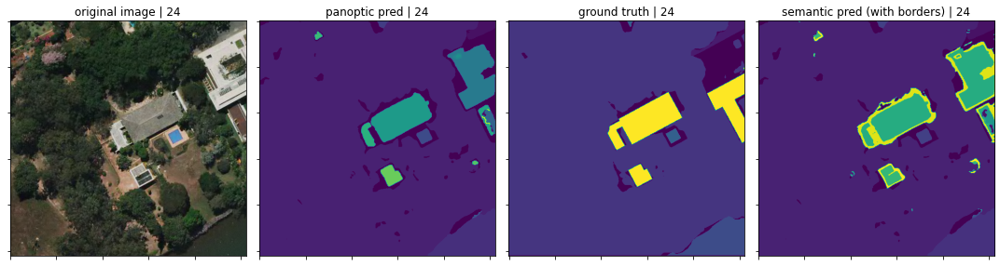

ID:25 | IoU: 0


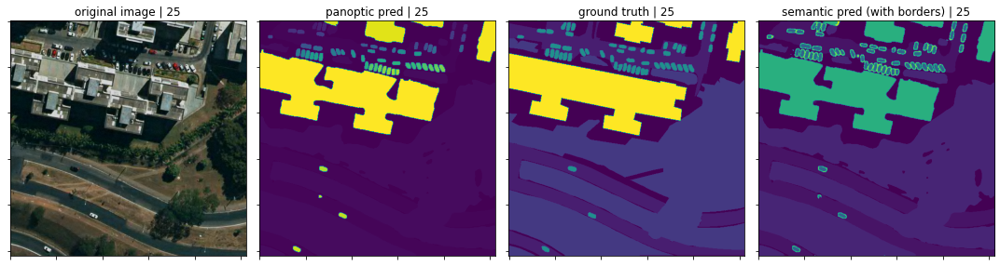

ID:26 | IoU: 0


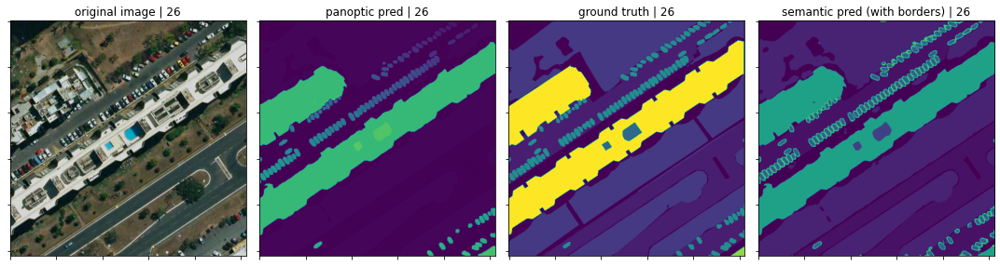

ID:27 | IoU: 0


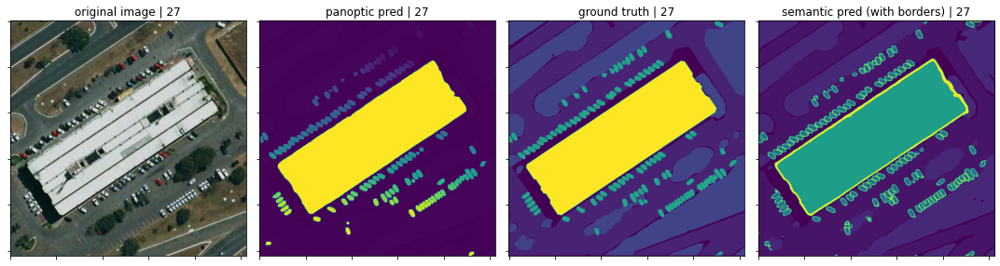

ID:28 | IoU: 0


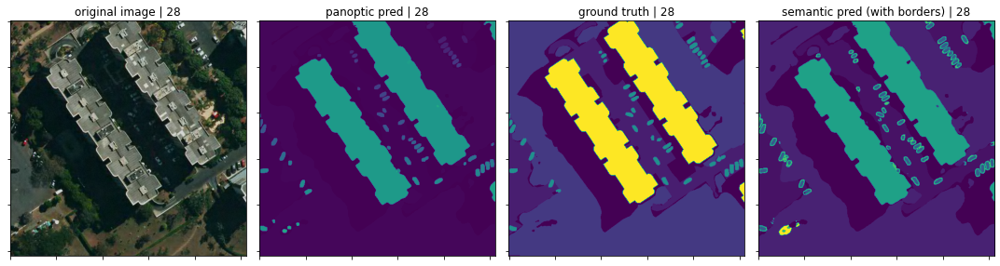

ID:29 | IoU: 0


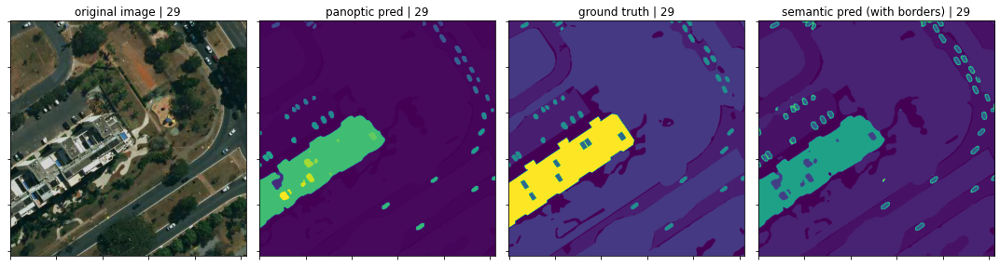

ID:30 | IoU: 0


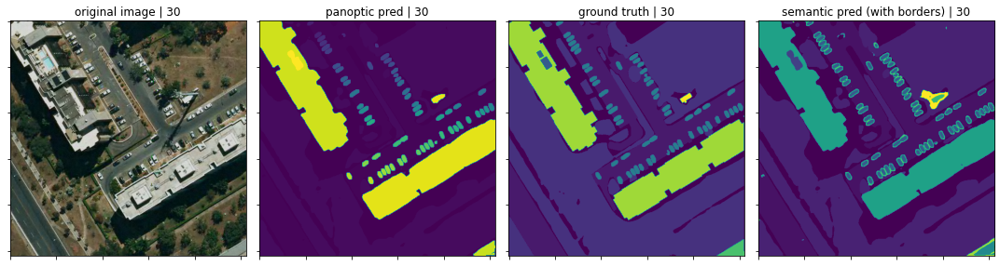

ID:31 | IoU: 0


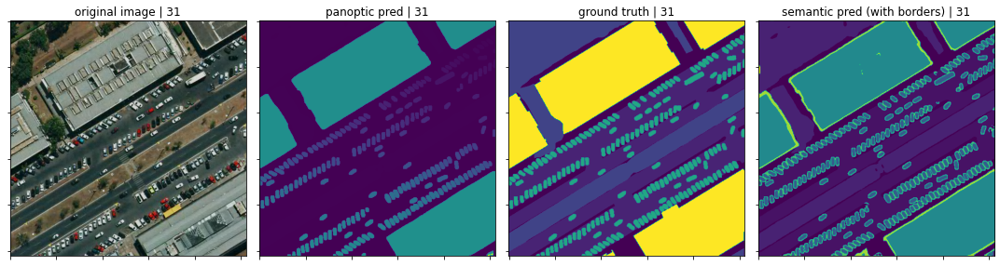

ID:32 | IoU: 0


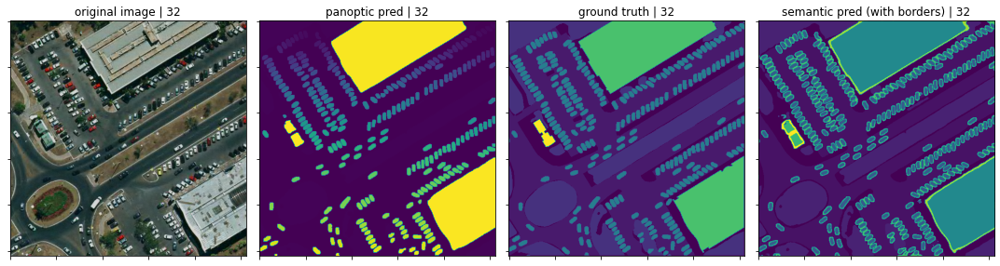

ID:33 | IoU: 0


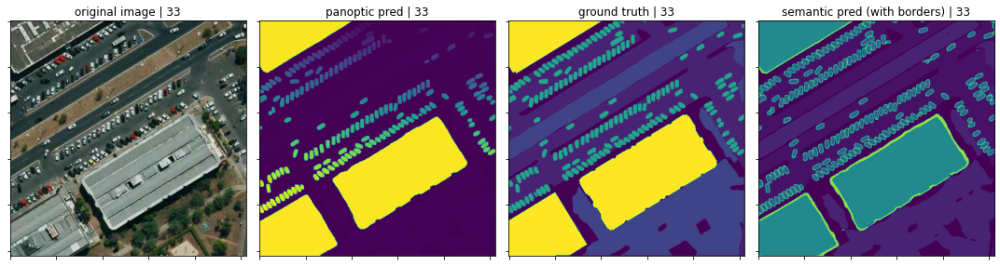

ID:34 | IoU: 0


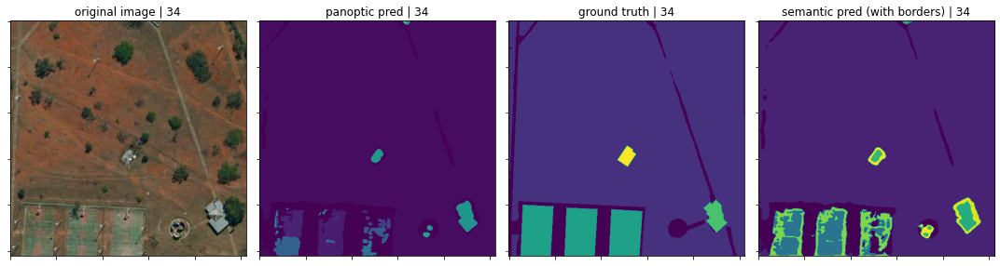

ID:35 | IoU: 0


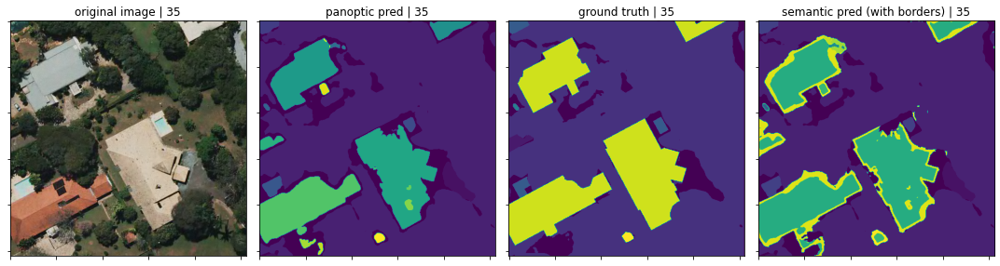

ID:36 | IoU: 0


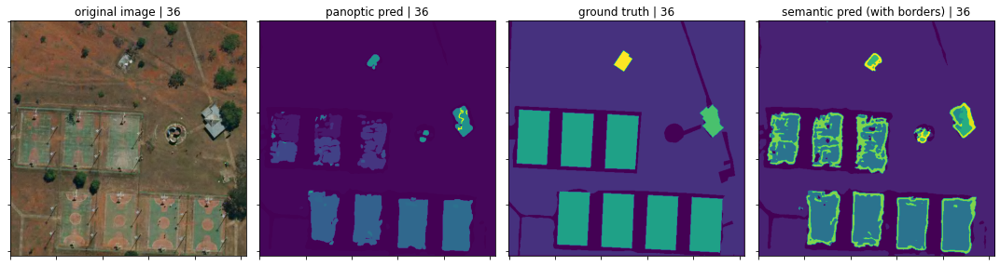

ID:37 | IoU: 0


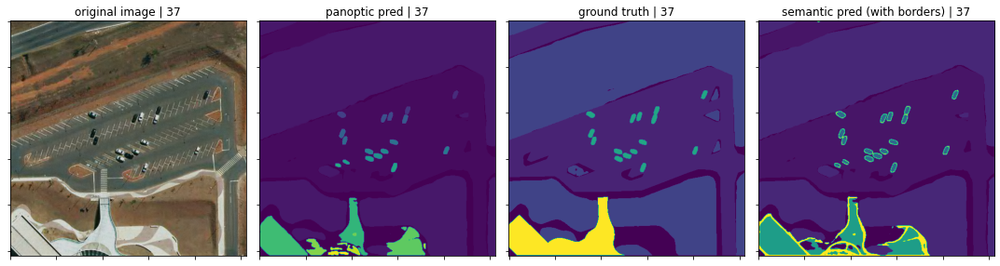

ID:38 | IoU: 0


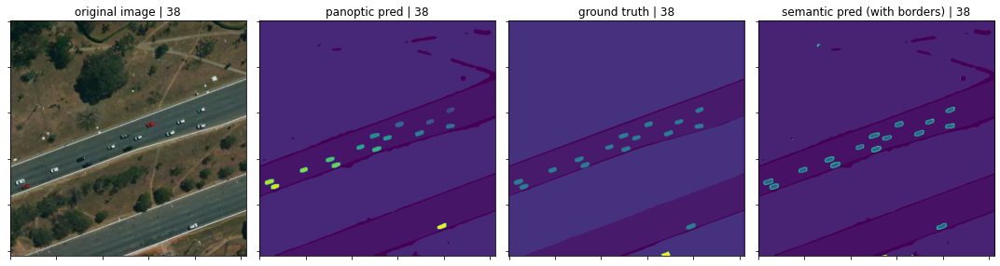

ID:39 | IoU: 0


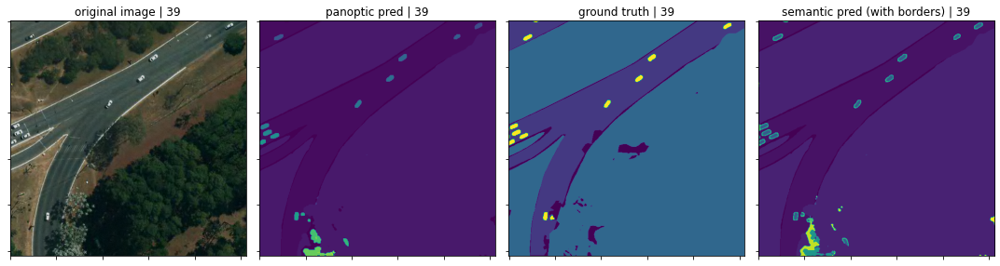

ID:40 | IoU: 0


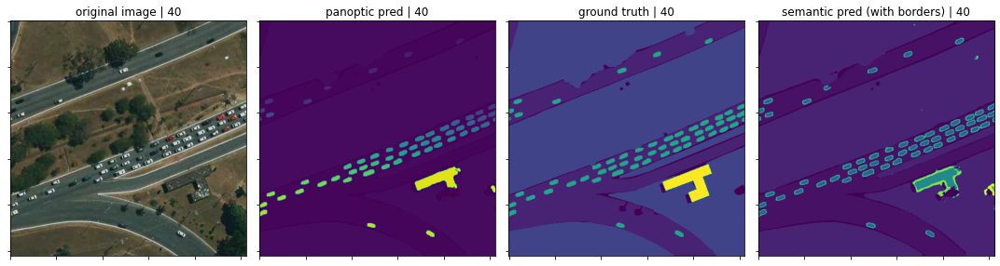

ID:41 | IoU: 0


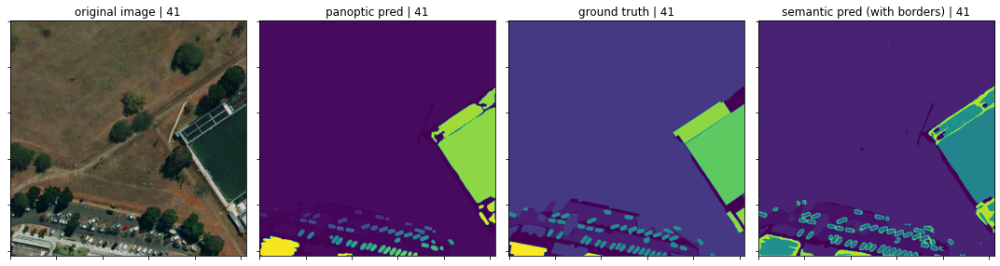

ID:42 | IoU: 0


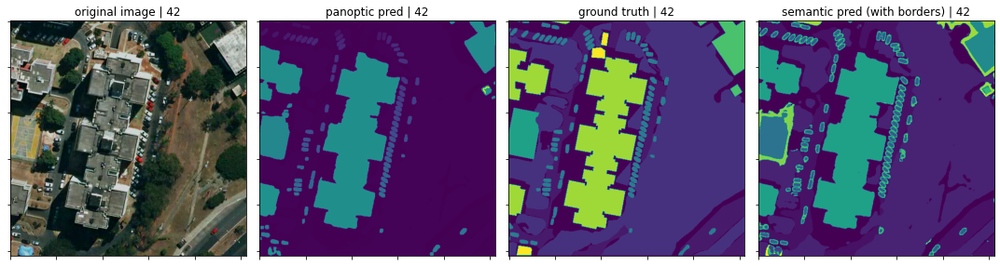

ID:43 | IoU: 0


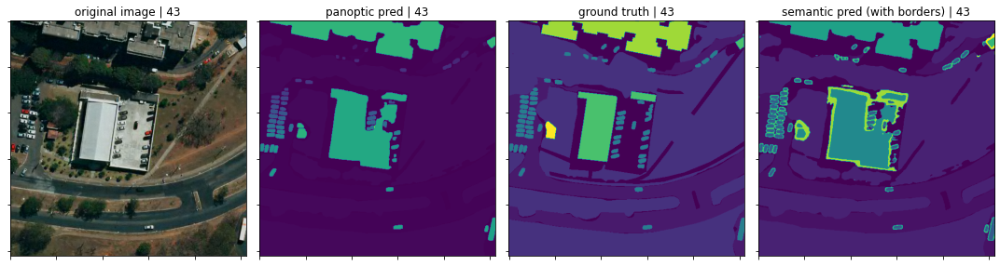

ID:44 | IoU: 0


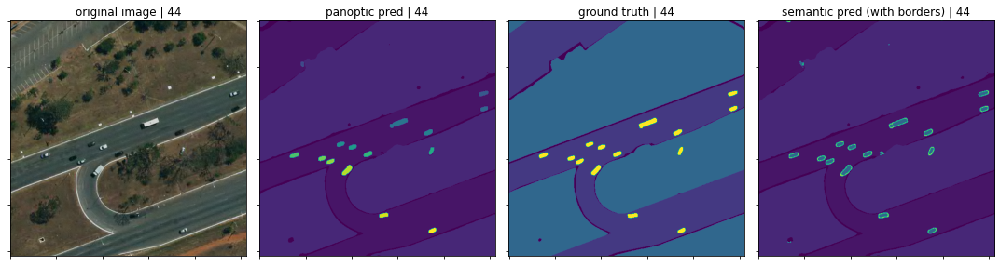

ID:45 | IoU: 0


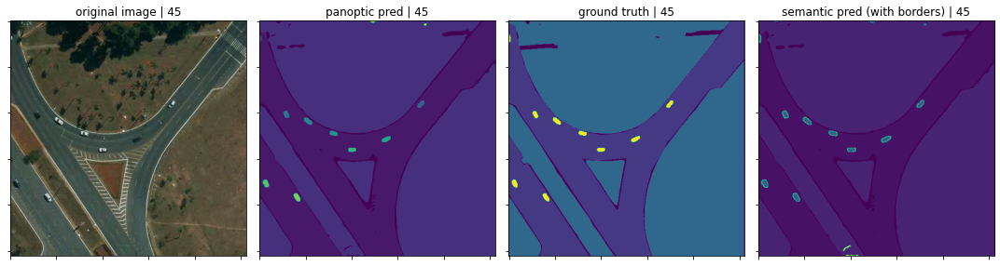

ID:46 | IoU: 0


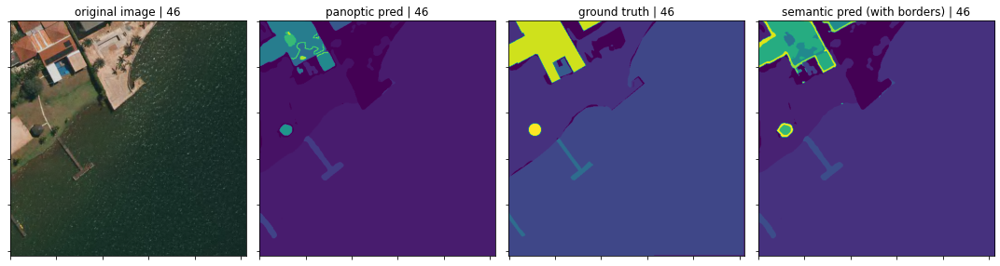

ID:47 | IoU: 0


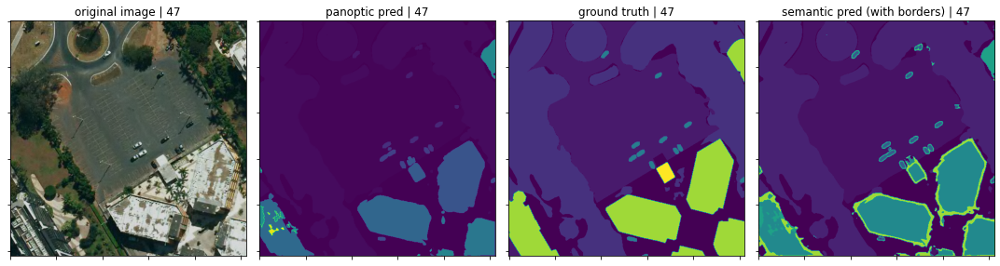

KeyboardInterrupt: 

In [25]:
actual_img_count = 0

pred_border = []
pred_no_border = []
gt = []


with torch.no_grad():
    
    for data in test_loader:

        inp, lab = data

        inp = inp.to(DEVICE)
        lab = lab.to(DEVICE)
        pred1 = model(inp)

        for i in range(0, 20):
            iou_score=0
            
            lab_unit = lab[i,:,:].cpu().numpy()
            
            lab_unit = np.where(lab_unit==15, 6, lab_unit)
            lab_unit = np.where(lab_unit==16, 7, lab_unit)
            lab_unit = np.where(lab_unit==17, 8, lab_unit)
            lab_unit = np.where(lab_unit==18, 10, lab_unit)
            lab_unit = np.where(lab_unit==19, 11, lab_unit)
            lab_unit = np.where(lab_unit==20, 13, lab_unit)
            lab_unit = np.where(lab_unit==21, 14, lab_unit)
            
            inp_unit = inp[i,:,:,:].cpu().numpy()
            inp_unit = np.transpose(inp_unit, (1, 2, 0))
                        
            pred_img = pred1[i,:,:,:].data.cpu().numpy()
            pred_img = np.argmax(pred_img, axis=0).reshape(512,512)        
             
            pred_no_border.append(np.where(pred_img>14,0,pred_img))
            
            final_pred = semantic2panoptic(semantic_pred=pred_img, agnostic=False)
            final_pred = np.sum(final_pred, axis=2)
            
            #for creating the metrics
            pred_border.append(semantic2panoptic(semantic_pred=pred_img, agnostic=True))
            gt.append(lab_unit)
            
            if (actual_img_count+1) == 31 or (actual_img_count+1) == 32:
                img_s_nb = Image.fromarray(pred_img.astype(int))
                img_s_nb.save('imgs_panoptic/' + str(actual_img_count+1) + '_no_border.tif')
                
                img_s_b = Image.fromarray(final_pred.astype(int))
                img_s_b.save('imgs_panoptic/' + str(actual_img_count+1) + '_border.tif')
                
                img_s_nb = Image.fromarray(lab_unit.astype(int))
                img_s_nb.save('imgs_panoptic/' + str(actual_img_count+1) + '_gt.tif')
                

            #"""           #FOR PLOTTING THE RESULTS           
            NUM_ROWS = 1
            IMGs_IN_ROW = 4
            f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(15,15))

            ax[0].imshow(inp_unit/300)       
            ax[1].imshow(final_pred)
            ax[2].imshow(lab_unit)
            ax[3].imshow(pred_img)
            
            ax[0].set_title('original image | '+str(actual_img_count+1))
            ax[1].set_title('panoptic pred | '+str(actual_img_count+1))
            ax[2].set_title('ground truth | '+str(actual_img_count+1))
            ax[3].set_title('semantic pred (with borders) | '+str(actual_img_count+1))

            ax[0].set_yticklabels([])
            ax[0].set_xticklabels([])

            ax[1].set_yticklabels([])
            ax[1].set_xticklabels([])

            ax[2].set_yticklabels([])
            ax[2].set_xticklabels([])
            
            ax[3].set_yticklabels([])
            ax[3].set_xticklabels([])

            print('ID:'+str(actual_img_count+1)+' | IoU: ' + str(round(iou_score, 3)))
            plt.tight_layout()
            
            plt.show()
            
            actual_img_count+=1    
            #"""
# transform list into numpy arrays            
arr_pr, arr_gt, arr_nb = np.array(pred_border), np.array(gt), np.array(pred_no_border)
print(arr_pr.shape, arr_gt.shape, arr_nb.shape)
arr_gt = arr_gt.reshape(-1)
arr_nb = arr_nb.reshape(-1)
del pred_border, gt, pred_no_border

# Evaluate metrics

- IoU per class
- mIoU

In [18]:
iou_list1 = []
iou_list2 = []
for i in range(1, 15):
    
    pr_now = arr_pr[:,:,:,i].reshape(-1)
    #print(pr_now.shape)
    
    nb_now = np.where(arr_nb==i, 1, 0)
    pr_now = np.where(pr_now==i, 1, 0)
    gt_now = np.where(arr_gt==i, 1, 0)
    
    iou_now1 = jaccard_score(gt_now, pr_now)
    iou_now2 = jaccard_score(gt_now, nb_now)
    iou_list1.append(iou_now1)
    iou_list2.append(iou_now2)
    print('class:', i, ', IoU border:', round(100*iou_now1, 2))
    print('class:', i, ', IoU no border:', round(100*iou_now2,2))
    print('-'*20)
    del iou_now1, iou_now2, pr_now, nb_now, gt_now

class: 1 , IoU border: 83.56
class: 1 , IoU no border: 83.56
--------------------
class: 2 , IoU border: 91.86
class: 2 , IoU no border: 91.86
--------------------
class: 3 , IoU border: 97.28
class: 3 , IoU no border: 97.28
--------------------
class: 4 , IoU border: 67.06
class: 4 , IoU no border: 66.86
--------------------
class: 5 , IoU border: 53.61
class: 5 , IoU no border: 53.2
--------------------
class: 6 , IoU border: 83.75
class: 6 , IoU no border: 60.17
--------------------
class: 7 , IoU border: 51.69
class: 7 , IoU no border: 43.85
--------------------
class: 8 , IoU border: 67.6
class: 8 , IoU no border: 64.02
--------------------
class: 9 , IoU border: 52.2
class: 9 , IoU no border: 51.84
--------------------
class: 10 , IoU border: 66.82
class: 10 , IoU no border: 65.09
--------------------
class: 11 , IoU border: 70.75
class: 11 , IoU no border: 69.1
--------------------
class: 12 , IoU border: 84.32
class: 12 , IoU no border: 84.61
--------------------
class: 13 , Io

In [19]:
import statistics
print(100*statistics.mean(iou_list1))
print(100*statistics.mean(iou_list2))

70.00534842468603
66.72839270177411


# TEST ON SINGLE IMAGE

In [ ]:
# select image
img_path = 'F:/0_BOX_FREE_PANOPTIC/borders/24/image_val/101.tiff'
image = imageio.imread(img_path).astype('float32') # read image
image = np.transpose(image, (2, 0, 1))
image = image.reshape(1, 3, 512, 512) # formato (1, C, H, W)

image = torch.from_numpy(image) # passar para tensor para ler a imagem
    
model.eval()

image = image.to(DEVICE).float()
actual_pred = model(image)
actual_pred = actual_pred.data.cpu().numpy()

pred_img = np.argmax(actual_pred, axis=1).reshape(512,512)
print(pred_img.shape)

# SLIDING WINDOW APPROACH

In [20]:
path = 'F:/0_BOX_FREE_PANOPTIC/Recort2560x2560/sw_img.tif'

In [21]:
def sliding_window(img_path, stride, window, model, DEVICE):
    
    image = imageio.imread(img_path).astype('float32')
    image = np.transpose(image, (2, 0, 1))
    print(image.shape)
    image = image.reshape(1, 3, image.shape[1], image.shape[2]) # formato (1, C, H, W)
    image = torch.from_numpy(image)
    print(image.shape)
    
    width, height = image.shape[2], image.shape[3]
    new_height, new_width = int((height-window)/stride)*stride, int((width-window)/stride)*stride
    img_width, img_height = new_width+window, new_height+window
    
    img_final = np.zeros((width, height, 22), dtype="float32")
    
    model.eval()
    
    for row in tqdm(range(0,new_width+1, stride)):
        for col in range(0,new_height+1, stride):
            #print(row, col)
            actual_img = image[:, :, row:row+window, col:col+window].to(DEVICE).float()
            actual_pred = model(actual_img).data.cpu().numpy().reshape(22, window, window)
            
            img_final[row:row+window, col:col+window, 0] += actual_pred[0,:,:]
            img_final[row:row+window, col:col+window, 1] += actual_pred[1,:,:]
            img_final[row:row+window, col:col+window, 2] += actual_pred[2,:,:]
            img_final[row:row+window, col:col+window, 3] += actual_pred[3,:,:]
            img_final[row:row+window, col:col+window, 4] += actual_pred[4,:,:]
            img_final[row:row+window, col:col+window, 5] += actual_pred[5,:,:]
            img_final[row:row+window, col:col+window, 6] += actual_pred[6,:,:]
            img_final[row:row+window, col:col+window, 7] += actual_pred[7,:,:]
            img_final[row:row+window, col:col+window, 8] += actual_pred[8,:,:]
            img_final[row:row+window, col:col+window, 9] += actual_pred[9,:,:]
            img_final[row:row+window, col:col+window, 10] += actual_pred[10,:,:]
            img_final[row:row+window, col:col+window, 11] += actual_pred[11,:,:]
            img_final[row:row+window, col:col+window, 12] += actual_pred[12,:,:]
            img_final[row:row+window, col:col+window, 13] += actual_pred[13,:,:]
            img_final[row:row+window, col:col+window, 14] += actual_pred[14,:,:]
            img_final[row:row+window, col:col+window, 15] += actual_pred[15,:,:]
            img_final[row:row+window, col:col+window, 16] += actual_pred[16,:,:]
            img_final[row:row+window, col:col+window, 17] += actual_pred[17,:,:]
            img_final[row:row+window, col:col+window, 18] += actual_pred[18,:,:]
            img_final[row:row+window, col:col+window, 19] += actual_pred[19,:,:]
            img_final[row:row+window, col:col+window, 20] += actual_pred[20,:,:]
            img_final[row:row+window, col:col+window, 21] += actual_pred[21,:,:]
            
    return np.argmax(img_final, axis=2)

# Check Different stride values

The lowest the stride value, the better the results but the longer it takes. 

In [22]:
#clf_512 = sliding_window(img_path=path,stride=512, window=512, model=model, DEVICE='cuda')
#clf_256 = sliding_window(img_path=path,stride=256, window=512, model=model, DEVICE='cuda')
#clf_128 = sliding_window(img_path=path,stride=128, window=512, model=model, DEVICE='cuda')
#clf_64 = sliding_window(img_path=path,stride=64, window=512, model=model, DEVICE='cuda')
clf_32 = sliding_window(img_path=path,stride=32, window=512, model=model, DEVICE='cuda')
#clf_16 = sliding_window(img_path=path,stride=16, window=512, model=model, DEVICE='cuda')
#clf_8 = sliding_window(img_path=path,stride=8, window=512, model=model, DEVICE='cuda')

(3, 2560, 2560)
torch.Size([1, 3, 2560, 2560])


  0%|          | 0/65 [00:00<?, ?it/s]

In [23]:
pan_pred = semantic2panoptic(semantic_pred=clf_32, show_classes=False, agnostic=False)

# SHOW LARGE IMAGE PREDICTION

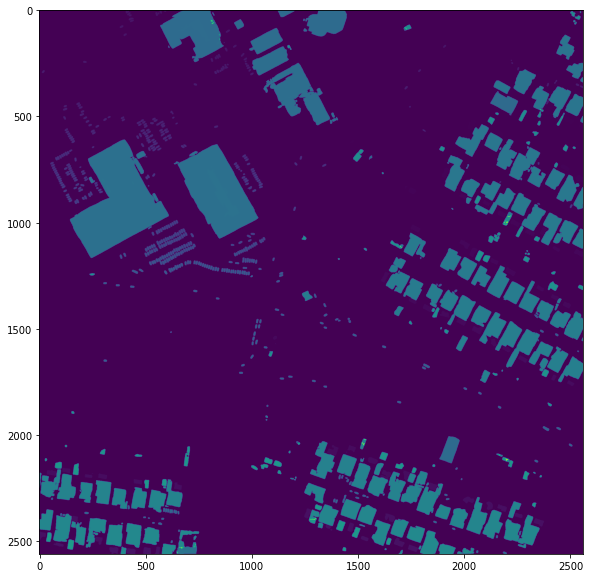

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(np.sum(pan_pred, axis=2))
plt.show()

# SAVE FINAL IMAGE

In [ ]:
img_s = Image.fromarray(final_pred)
img_s.save('sw_result.tif')